<a href="https://colab.research.google.com/github/weedge/doraemon-nb/blob/main/OpenBMB_MiniCPMo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/OpenBMB/MiniCPM-o.git

In [ ]:
!cd /content/MiniCPM-o && pip install -q -r requirements_o2.6.txt

# Prepare code and install AutoGPTQ


In [3]:
%cd /content

/content


In [ ]:
!git clone https://github.com/OpenBMB/AutoGPTQ.git -b minicpmo
!cd AutoGPTQ && git checkout minicpmo && pip install -vvv --quiet --no-build-isolation -e .


# NOTE:
need restart session

# download model

In [5]:
from google.colab import userdata
HF_TOKEN=userdata.get('HF_TOKEN')

In [ ]:
!huggingface-cli login --token $HF_TOKEN --add-to-git-credential


In [3]:
!huggingface-cli download openbmb/MiniCPM-o-2_6 --quiet --local-dir /content/models/openbmb/MiniCPM-o-2_6


/content/models/openbmb/MiniCPM-o-2_6


In [3]:
!huggingface-cli download openbmb/MiniCPM-o-2_6-int4 --quiet --local-dir /content/models/openbmb/MiniCPM-o-2_6-int4

/content/models/openbmb/MiniCPM-o-2_6-int4


# inference

In [1]:
%cd /content/MiniCPM-o

/content/MiniCPM-o


In [2]:
import torch

def print_model_params(model: torch.nn.Module, extra_info=""):
    # print the number of parameters in the model
    model_million_params = sum(p.numel() for p in model.parameters()) / 1e6
    print(model)
    print(f"{extra_info} {model_million_params} M parameters")

## Usage of MiniCPM-o-2_6-int4


In [4]:
# load
import torch
from transformers import AutoModel, AutoTokenizer
from auto_gptq import AutoGPTQForCausalLM

model = AutoGPTQForCausalLM.from_quantized(
    '/content/models/openbmb/MiniCPM-o-2_6-int4',
    torch_dtype=torch.bfloat16,
    device="cuda:0",
    trust_remote_code=True,
    disable_exllama=True,
    disable_exllamav2=True,
    init_vision=False,
    init_audio=False,
    init_tts=True,
)
print_model_params(model, "MiniCPM-o-2_6-int4")
model = model.eval().cuda()
tokenizer = AutoTokenizer.from_pretrained(
    '/content/models/openbmb/MiniCPM-o-2_6-int4',
    trust_remote_code=True
)

model.init_tts()
#model.tts.float()

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

WARNING - AutoGPTQ has stopped development. Please transition to GPTQModel: https://github.com/ModelCoud/GPTQModel
GPTQModel has been merged into Transformers/Optimum and full deprecation of AutoGPTQ within HF frameworks is planned in the near-future.
INFO - Ignoring unknown parameter in the quantization configuration: lm_head.
WARNING - Overriding use_cuda_fp16 to False since torch_dtype is not torch.float16.
/usr/local/lib/python3.11/dist-packages/transformers/models/auto/image_processing_auto.py:513: FutureWarning: The image_processor_class argument is deprecated and will be removed in v4.42. Please use `slow_image_processor_class`, or `fast_image_processor_class` instead
  warnings.warn(
INFO - The layer llm.lm_head is not quantized.
INFO - The layer vpm.embeddings.patch_embedding is not quantized.
INFO - The layer vpm.encoder.layers.0.self_attn.k_proj is not quantized.
INFO - The layer vpm.encoder.layers.0.self_attn.v_proj is not quantized.
INFO - The layer vpm.encoder.layers.0.se

MiniCPMOGPTQForCausalLM(
  (model): MiniCPMO(
    (llm): Qwen2ForCausalLM(
      (model): Qwen2Model(
        (embed_tokens): Embedding(151700, 3584)
        (layers): ModuleList(
          (0-27): 28 x Qwen2DecoderLayer(
            (self_attn): Qwen2SdpaAttention(
              (q_proj): QuantLinear()
              (k_proj): QuantLinear()
              (v_proj): QuantLinear()
              (o_proj): QuantLinear()
              (rotary_emb): Qwen2RotaryEmbedding()
            )
            (mlp): Qwen2MLP(
              (gate_proj): QuantLinear()
              (up_proj): QuantLinear()
              (down_proj): QuantLinear()
              (act_fn): SiLU()
            )
            (input_layernorm): Qwen2RMSNorm((3584,), eps=1e-06)
            (post_attention_layernorm): Qwen2RMSNorm((3584,), eps=1e-06)
          )
        )
        (norm): Qwen2RMSNorm((3584,), eps=1e-06)
      )
      (lm_head): Linear(in_features=3584, out_features=151700, bias=False)
    )
    (vpm): SiglipVisionT

### Omni mode （vision + voice）
provide two inference modes: chat and streaming

#### Chat inference



In [10]:
from IPython.display import Audio
Audio(data="assets/ref_audios/default.wav", autoplay=True)

In [ ]:
from IPython.display import HTML

HTML("""
    <video alt="test" controls>
        <source src="assets/demo_video.mp4" type="video/mp4">
    </video>
""")


In [23]:
from IPython.display import Audio
Audio(data="assets/demo_video.mp4", autoplay=True)

In [8]:
import math
import numpy as np
from PIL import Image
from moviepy.editor import VideoFileClip
import tempfile
import librosa
import soundfile as sf

In [ ]:
def get_video_chunk_content(video_path, flatten=True):
    video = VideoFileClip(video_path)
    print('video_duration:', video.duration)

    with tempfile.NamedTemporaryFile(suffix=".wav", delete=True) as temp_audio_file:
        temp_audio_file_path = temp_audio_file.name
        video.audio.write_audiofile(temp_audio_file_path, codec="pcm_s16le", fps=16000)
        audio_np, sr = librosa.load(temp_audio_file_path, sr=16000, mono=True)
    num_units = math.ceil(video.duration)

    # 1 frame + 1s audio chunk
    contents= []
    for i in range(num_units):
        frame = video.get_frame(i+1)
        image = Image.fromarray((frame).astype(np.uint8))
        audio = audio_np[sr*i:sr*(i+1)]
        if flatten:
            contents.extend(["<unit>", image, audio])
        else:
            contents.append(["<unit>", image, audio])

    return contents

video_path="assets/demo_video.mp4"
# if use voice clone prompt, please set ref_audio
ref_audio_path = 'assets/ref_audios/default.wav'
ref_audio, _ = librosa.load(ref_audio_path, sr=16000, mono=True)
sys_msg = model.get_sys_prompt(ref_audio=ref_audio, mode='omni', language='en')
# or use default prompt
# sys_msg = model.get_sys_prompt(mode='omni', language='en')

contents = get_video_chunk_content(video_path)
msg = {"role":"user", "content": contents}
msgs = [sys_msg, msg]

# please set generate_audio=True and output_audio_path to save the tts result
generate_audio = True
output_audio_path = 'output.wav'

res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    temperature=0.5,
    max_new_tokens=4096,
    omni_input=True, # please set omni_input=True when omni inference
    use_tts_template=True,
    generate_audio=generate_audio,
    output_audio_path=output_audio_path,
    max_slice_nums=1,
    use_image_id=False,
    return_dict=True
)
print(res)

## You will get the answer: The person in the picture is skiing down a snowy slope.


In [ ]:
import IPython
IPython.display.Audio('output.wav')

#### Streaming inference



In [ ]:
# a new conversation need reset session first, it will reset the kv-cache
model.reset_session()

contents = get_video_chunk_content(video_path, flatten=False)
session_id = '123'
generate_audio = True

# 1. prefill system prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=[sys_msg],
    tokenizer=tokenizer
)

# 2. prefill video/audio chunks
for content in contents:
    msgs = [{"role":"user", "content": content}]
    res = model.streaming_prefill(
        session_id=session_id,
        msgs=msgs,
        tokenizer=tokenizer
    )

# 3. generate
res = model.streaming_generate(
    session_id=session_id,
    tokenizer=tokenizer,
    temperature=0.5,
    generate_audio=generate_audio
)

audios = []
text = ""

if generate_audio:
    for r in res:
        audio_wav = r.audio_wav
        sampling_rate = r.sampling_rate
        txt = r.text

        audios.append(audio_wav)
        text += txt

    res = np.concatenate(audios)
    sf.write("output.wav", res, samplerate=sampling_rate)
    print("text:", text)
    print("audio saved to output.wav")
else:
    for r in res:
        text += r['text']
    print("text:", text)


In [ ]:
import IPython
IPython.display.Audio('output.wav')

#### chat with img + audio

In [ ]:
from pickle import FALSE
torch.manual_seed(100)

# if use voice clone prompt, please set ref_audio
ref_audio_path = 'assets/ref_audios/female_example.wav'
ref_audio, _ = librosa.load(ref_audio_path, sr=16000, mono=True)
sys_msg = model.get_sys_prompt(ref_audio=ref_audio, mode='omni', language='zh')
# or use default prompt
# sys_msg = model.get_sys_prompt(mode='omni', language='en')

image = Image.open('./assets/minicpmo2_6/show_demo.jpg').convert('RGB')
audio_input, _ = librosa.load('/content/test.wav', sr=16000, mono=True) # load the audio to be mimicked

# First round chat
msgs = [{'role': 'user', 'content': [image, audio_input]}]

# a new conversation need reset session first, it will reset the kv-cache
model.reset_session()
session_id = '123'
generate_audio = True


# 1. prefill system prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=[sys_msg],
    tokenizer=tokenizer
)


# 2. prefill prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=msgs,
    tokenizer=tokenizer
)

# 2. generate
res = model.streaming_generate(
    session_id=session_id,
    tokenizer=tokenizer,
    temperature=0.5,
    generate_audio=generate_audio
)

audios = []
text = ""

if generate_audio:
    for r in res:
        audio_wav = r.audio_wav
        sampling_rate = r.sampling_rate
        txt = r.text

        audios.append(audio_wav)
        if txt!="<|tts_eos|>":
            text += txt
            print(txt,end="",flush=True)

    res = np.concatenate(audios)
    sf.write("output.wav", res, samplerate=sampling_rate)
    print("\n text:", text)
    print("audio saved to output.wav")
else:
    for r in res:
        if "<|tts_eos|>" in r['text']:
          r['text'] = r['text'].replace("<|tts_eos|>", "")
          text += r['text']

          print(r['text'],end="",flush=True)
    print(f"\n text:",text)


In [32]:
import IPython
IPython.display.Audio('output.wav',autoplay=True)

### vision-only

#### streaming chat

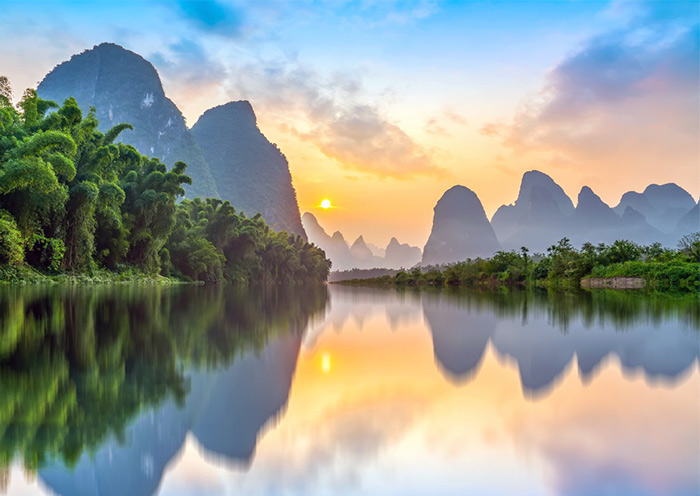

In [9]:
from IPython.display import Image
Image(filename='./assets/minicpmo2_6/show_demo.jpg')

In [13]:
torch.manual_seed(100)

image = Image.open('./assets/minicpmo2_6/show_demo.jpg').convert('RGB')

# First round chat
question = "图片中是什么地形?"
msgs = [{'role': 'user', 'content': [image, question]}]

# a new conversation need reset session first, it will reset the kv-cache
model.reset_session()
session_id = '123'
generate_audio = False

# 1. prefill prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=msgs,
    tokenizer=tokenizer
)

# 2. generate
res = model.streaming_generate(
    session_id=session_id,
    tokenizer=tokenizer,
    temperature=0.5,
    generate_audio=generate_audio
)

audios = []
text = ""

if generate_audio:
    for r in res:
        audio_wav = r.audio_wav
        sampling_rate = r.sampling_rate
        txt = r.text

        audios.append(audio_wav)
        if txt!="<|tts_eos|>":
            text += txt
            print(txt,end="",flush=True)

    res = np.concatenate(audios)
    sf.write("output.wav", res, samplerate=sampling_rate)
    print("\n text:", text)
    print("audio saved to output.wav")
else:
    for r in res:
        if r['text']!="<|tts_eos|>":
          text += r['text']
          print(r['text'],end="",flush=True)
    print(f"\n text:",text)


图片中的地形是喀斯特山脉，以高耸的石灰岩山峰为特征，这些山峰在日出的射线上清晰可见。这些山峰通常在山谷中孤立地出现，形成独特的景观。这种地形通常与热带或亚热带地区相关联，如东南亚的某些部分，那里的石灰岩层通过侵蚀和抬升过程形成。在图片中，这些山峰被茂密的绿色植被环绕，这在热带和亚热带气候中很典型。水中的倒影也增加了风景的美丽，突出了这种地形的宁静和风景如画的品质。
 text: 图片中的地形是喀斯特山脉，以高耸的石灰岩山峰为特征，这些山峰在日出的射线上清晰可见。这些山峰通常在山谷中孤立地出现，形成独特的景观。这种地形通常与热带或亚热带地区相关联，如东南亚的某些部分，那里的石灰岩层通过侵蚀和抬升过程形成。在图片中，这些山峰被茂密的绿色植被环绕，这在热带和亚热带气候中很典型。水中的倒影也增加了风景的美丽，突出了这种地形的宁静和风景如画的品质。


In [12]:
from IPython.display import Audio
Audio(data="output.wav", autoplay=True)

#### multi round chat

In [4]:
import torch
from PIL import Image

torch.manual_seed(100)

image = Image.open('./assets/minicpmo2_6/show_demo.jpg').convert('RGB')

# First round chat
question = "What is the landform in the picture?"
msgs = [{'role': 'user', 'content': [image, question]}]

answer = model.chat(
    msgs=msgs,
    tokenizer=tokenizer
)
print(answer)

# Second round chat, pass history context of multi-turn conversation
msgs.append({"role": "assistant", "content": [answer]})
msgs.append({"role": "user", "content": ["What should I pay attention to when traveling here?"]})

answer = model.chat(
    msgs=msgs,
    tokenizer=tokenizer
)
print(answer)

The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.


The landform in the picture is a mountain. Mountains are large, elevated regions of land that rise prominently above surrounding areas and have typically feature steep slopes or cliffs. They can be formed through various geological processes such as tectonic activity, volcanic eruptions, or erosion over time. The presence of mountains adds to the scenic beauty of landscapes like this one, providing stunning views for those who visit them.
When traveling, it's important to pay attention to the natural beauty of places like this one. Observing and appreciating landscapes can provide a sense of tranquility and appreciation for nature. Additionally, being mindful of environmental protection is crucial as well; respecting wildlife habitats and preserving local ecosystems contributes positively towards sustainable tourism practices that allow future generations to enjoy these magnificent views too.


#### multi round chat streaming

In [ ]:
import torch
from PIL import Image
model.reset_session()

torch.manual_seed(100)

image = Image.open('./assets/minicpmo2_6/show_demo.jpg').convert('RGB')

# First round chat
question = "What is the landform in the picture?"
msgs = [{'role': 'user', 'content': [image, question]}]

session_id = '123'
generate_audio = False

# 1. prefill prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=msgs,
    tokenizer=tokenizer
)

# 2. generate
res = model.streaming_generate(
    session_id=session_id,
    tokenizer=tokenizer,
    temperature=0.5,
    generate_audio=generate_audio
)

audios = []
text = ""

if generate_audio:
    for r in res:
        audio_wav = r.audio_wav
        sampling_rate = r.sampling_rate
        txt = r.text

        audios.append(audio_wav)
        if txt!="<|tts_eos|>":
            text += txt
            print(txt,end="",flush=True)

    res = np.concatenate(audios)
    sf.write("output.wav", res, samplerate=sampling_rate)
    print("audio saved to output.wav")
else:
    for r in res:
        if r['text']!="<|tts_eos|>":
          text += r['text']
          print(r['text'],end="",flush=True)
print(f"\n text:",text)

# Second round chat, pass history context of multi-turn conversation
msgs.append({"role": "assistant", "content": [text]})
msgs.append({"role": "user", "content": ["What should I pay attention to when traveling here?"]})

# 1. prefill prompt
res = model.streaming_prefill(
    session_id=session_id,
    msgs=msgs,
    tokenizer=tokenizer
)

# 2. generate
res = model.streaming_generate(
    session_id=session_id,
    tokenizer=tokenizer,
    temperature=0.5,
    generate_audio=generate_audio
)

audios = []
text = ""

if generate_audio:
    for r in res:
        audio_wav = r.audio_wav
        sampling_rate = r.sampling_rate
        txt = r.text

        audios.append(audio_wav)
        if txt!="<|tts_eos|>":
            text += txt
            print(txt,end="",flush=True)

    res = np.concatenate(audios)
    sf.write("output.wav", res, samplerate=sampling_rate)
    print("audio saved to output.wav")
else:
    for r in res:
        if r['text']!="<|tts_eos|>":
          text += r['text']
          print(r['text'],end="",flush=True)
print(f"\n text:",text)


#### Chat with Multiple Images


In [7]:
image1 = Image.open('assets/title-1.png').convert('RGB')
image2 = Image.open('assets/title-1.png').convert('RGB')
#question = 'Compare image 1 and image 2, tell me about the differences between image 1 and image 2.'
question = '比较图片的不同之处'

msgs = [{'role': 'user', 'content': [image1, image2, question]}]

answer = model.chat(
    msgs=msgs,
    tokenizer=tokenizer
)
print(answer)


在提供的图片中，有两幅画都是用蓝色字体写着“OmniLMM”。它们之间唯一的区别是第一幅画的“O”是白色的，而第二幅画的“O”是蓝色的。此外，第二幅画的“i”的顶部有一条水平线，而第一幅画的“i”没有。


#### In-context Few-shot Learning


In [9]:
question = "颜色和文字"
image1 = Image.open('assets/title-1.png').convert('RGB')
answer1 = "绿色OmniLLM"
image2 = Image.open('assets/title-2.png').convert('RGB')
answer2 = "蓝色OmniLLM"
image_test = Image.open('assets/title-3.png').convert('RGB')

msgs = [
    {'role': 'user', 'content': [image1, question]}, {'role': 'assistant', 'content': [answer1]},
    {'role': 'user', 'content': [image2, question]}, {'role': 'assistant', 'content': [answer2]},
    {'role': 'user', 'content': [image_test, question]}
]

answer = model.chat(
    msgs=msgs,
    tokenizer=tokenizer
)
print(answer)


蓝色OmniLLM


颜色区分不出来

#### Chat with Video

In [ ]:
from decord import VideoReader, cpu    # pip install decord
from PIL import Image

MAX_NUM_FRAMES=64 # if cuda OOM set a smaller number

def encode_video(video_path):
    def uniform_sample(l, n):
        gap = len(l) / n
        idxs = [int(i * gap + gap / 2) for i in range(n)]
        return [l[i] for i in idxs]

    vr = VideoReader(video_path, ctx=cpu(0))
    sample_fps = round(vr.get_avg_fps() / 1)  # FPS
    frame_idx = [i for i in range(0, len(vr), sample_fps)]
    if len(frame_idx) > MAX_NUM_FRAMES:
        frame_idx = uniform_sample(frame_idx, MAX_NUM_FRAMES)
    frames = vr.get_batch(frame_idx).asnumpy()
    frames = [Image.fromarray(v.astype('uint8')) for v in frames]
    print('num frames:', len(frames))
    return frames

video_path="assets/demo_video.mp4"
frames = encode_video(video_path)
question = "描述视频内容"
msgs = [
    {'role': 'user', 'content': frames + [question]},
]

# Set decode params for video
params = {}
params["use_image_id"] = False
params["max_slice_nums"] = 2 # use 1 if cuda OOM and video resolution > 448*448

answer = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    **params
)
print(answer)


### Voice Mode(Speech and Audio Mode)

#### Mimick (reconstructed audio)

In [8]:
import librosa

mimick_prompt = "Please repeat each user's speech, including voice style and speech content."
audio_input, _ = librosa.load('assets/ref_audios/default.wav', sr=16000, mono=True) # load the audio to be mimicked

# can also try `./assets/input_examples/cxk_original.wav`,
# `./assets/input_examples/fast-pace.wav`,
# `./assets/input_examples/chi-english-1.wav`
# `./assets/input_examples/exciting-emotion.wav`
# for different aspects of speech-centric features.

msgs = [{'role': 'user', 'content': [mimick_prompt, audio_input]}]
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    temperature=0.3,
    generate_audio=True,
    output_audio_path='output_mimick.wav', # save the tts result to output_audio_path
)


The `seen_tokens` attribute is deprecated and will be removed in v4.41. Use the `cache_position` model input instead.
We detected that you are passing `past_key_values` as a tuple and this is deprecated and will be removed in v4.43. Please use an appropriate `Cache` class (https://huggingface.co/docs/transformers/v4.41.3/en/internal/generation_utils#transformers.Cache)


In [13]:
from IPython.display import Audio
Audio(data="output_mimick.wav", autoplay=True)


In [12]:
Audio(data="assets/ref_audios/default.wav", autoplay=True)

#### General Speech Conversation with Configurable Voices



In [15]:
from IPython.display import Audio
Audio(data="assets/ref_audios/video_default.wav", autoplay=True)

In [17]:
Audio(data="assets/ref_audios/male_example.wav", autoplay=True)

In [20]:
ref_audio, _ = librosa.load('assets/ref_audios/male_example.wav', sr=16000, mono=True) # load the reference audio
sys_prompt = model.get_sys_prompt(ref_audio=ref_audio, mode='audio_roleplay', language='en')

# round one
user_question = {'role': 'user', 'content': [librosa.load('assets/ref_audios/video_default.wav', sr=16000, mono=True)[0]]}
msgs = [sys_prompt, user_question]
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print("round one res:",res)

# round two
msgs.append({'role': 'assistant', 'content': res})
user_question = {'role': 'user', 'content': [librosa.load('assets/ref_audios/default.wav', sr=16000, mono=True)[0]]}
msgs.append(user_question)
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result_round_2.wav',
)
print("round two res:",res)



round one res: OmniOutput(text='嗨，我是MiniCPMS3Oni，由FaceBi  Technologies Co.,Ltd.研发。有什么我可以帮到你的吗？', spk_embeds=None, audio_wav=tensor([-1.2646e-04, -5.5382e-04, -8.0395e-04,  ...,  2.4290e-05,
         5.9228e-05,  8.0338e-05]), sampling_rate=24000)
round two res: OmniOutput(text='我从来没有想过这个问题。但我觉得，可能我妈妈年轻时的样子和我一样，都是独一无二的的。她对我和对其他人一样，总是充满了爱和关心。虽然我们之间有时候会有争执，但我还是觉得她是我生命中最重要的人之一。 <|interrupt|>', spk_embeds=None, audio_wav=tensor([-0.0055, -0.0056, -0.0058,  ...,  0.0002,  0.0002,  0.0002]), sampling_rate=24000)


#### Speech Conversation as an AI Assistant

In [23]:
sys_prompt = model.get_sys_prompt(ref_audio=ref_audio, mode='audio_assistant', language='en')
# round one
user_question = {'role': 'user', 'content': [librosa.load('assets/ref_audios/video_default.wav', sr=16000, mono=True)[0]]}
msgs = [sys_prompt, user_question]
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print("round one res:",res)

# round two
msgs.append({'role': 'assistant', 'content': res})
user_question = {'role': 'user', 'content': [librosa.load('assets/ref_audios/default.wav', sr=16000, mono=True)[0]]}
msgs.append(user_question)
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result_round_2.wav',
)
print("round two res:",res)


round one res: OmniOutput(text='你好！我是MiniCPM-3000，由面壁智能科技有限责任公司研发。今天我能为你做些什么呢？', spk_embeds=None, audio_wav=tensor([-1.0408e-02, -1.0328e-02, -1.0310e-02,  ...,  5.8811e-05,
         7.4575e-05,  6.7925e-05]), sampling_rate=24000)
round two res: OmniOutput(text='是的，我记得。她总是穿着漂亮的裙子，头发梳得整整齐齐。她喜欢唱歌跳舞，还带我去参加过很多音乐会和舞蹈班。每次看到她跳舞的样子，我都觉得特别幸福。你呢？你有没有和你妈妈一起跳舞的经历？', spk_embeds=None, audio_wav=tensor([ 0.0007,  0.0005, -0.0007,  ...,  0.0004,  0.0005,  0.0004]), sampling_rate=24000)


In [24]:
from IPython.display import Audio
Audio(data="result.wav", autoplay=True)

In [25]:
Audio(data="result_round_2.wav", autoplay=True)

#### Instruction-to-Speech
https://voxinstruct.github.io/VoxInstruct/


In [30]:
from IPython.display import Audio
Audio(data="assets/ref_audios/video_default.wav", autoplay=True)

In [78]:
sys_prompt = model.get_sys_prompt(ref_audio=None, mode='omni', language='zh')

instruction = """
Speak like a male charming superstar, radiating confidence and style in every word. Please read the text below:
"hello world,你叫什么名字？我们首先介绍Minicpm-O 2.6的整体体系结构，用于端到端OMNI模型建模。该模型是基于Siglip-400m，Whisper-Medium-300m，Chattts-200M和Qwen2.5-7b-Instruct建立的，总计为8B参数。总体框架如下所示。"
"""

msgs = [{'role': 'user', 'content': [instruction]}]

res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print(res)

OmniOutput(text='你好世界，你叫什么名字？我们首先介绍Minicpm-O 2.6的整体架构，用于端到端OMNI模型建模。该模型是基于Siglip-400m，Whisper-Medium-300m，Chattts-200M和Qwen2.5-7b-Instruct建立的，总计为8B参数。总体框架如下所示。', spk_embeds=None, audio_wav=tensor([9.2110e-03, 9.4359e-03, 9.6080e-03,  ..., 4.8438e-05, 5.8551e-05,
        4.7589e-05]), sampling_rate=24000)


In [79]:
from IPython.display import Audio
Audio(data="result.wav", autoplay=True)

总结：
- 整体 Instruction-to-Speech 生成的语音需要指令来控制，
- 对应在线一致语音聊天不适合， 适合离线随机生成音频。
- 而且生成的音频质量不如sota TTS模型
- 试了下加入sys promt, 生成的文本内容可能不是指定的文本，
- voice cloning只能用于聊天，不能通过克隆语音，指定文本来生成对应语音

#### Voice Cloning to chat


In [69]:
import librosa

# if use voice clone prompt, please set ref_audio
ref_audio_path = 'assets/ref_audios/male_example.wav'
ref_audio, _ = librosa.load(ref_audio_path, sr=16000, mono=True)

sys_prompt = model.get_sys_prompt(ref_audio=ref_audio, mode='voice_cloning', language='en')
text_prompt = f"Please read the text below."
user_question = {'role': 'user', 'content': [text_prompt,"what's your name?"]}

msgs = [sys_prompt, user_question]
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print(res)

OmniOutput(text="Hello I'm an AI assistant, here to help you with any questions or information you need. What can I assist you with today?", spk_embeds=None, audio_wav=tensor([-3.0811e-03, -4.3607e-03, -3.4553e-03,  ...,  4.0965e-05,
         3.3372e-05, -8.7848e-06]), sampling_rate=24000)


In [53]:
import librosa

# if use voice clone prompt, please set ref_audio
ref_audio_path = 'assets/ref_audios/male_example.wav'
ref_audio, _ = librosa.load(ref_audio_path, sr=16000, mono=True)

sys_prompt = model.get_sys_prompt(ref_audio=ref_audio, mode='voice_cloning', language='en')
text_prompt = f"Please read the text below."
user_question = {'role': 'user', 'content': [text_prompt, "what's your name?"]}

msgs = [sys_prompt, user_question]
res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print(res)

OmniOutput(text="Hello I'm an AI assistant created by OpenAI. What's your name?", spk_embeds=None, audio_wav=tensor([ 7.3563e-06, -7.4438e-04, -2.5423e-03,  ...,  2.4167e-04,
         2.7429e-04,  3.2299e-04]), sampling_rate=24000)


In [54]:
from IPython.display import Audio
Audio(data="result.wav", autoplay=True)

#### Addressing Various Audio Understanding Tasks
- ASR with ZH(same as AST en2zh): 请仔细听这段音频片段，并将其内容逐字记录。
- ASR with EN(same as AST zh2en): Please listen to the audio snippet carefully and transcribe the content.
- Speaker Analysis: Based on the speaker's content, speculate on their gender, condition, age range, and health status.
- General Audio Caption: Summarize the main content of the audio.
- General Sound Scene Tagging: Utilize one keyword to convey the audio's content or the associated scene.


In [28]:
task_prompt = "Please listen to the audio snippet carefully and transcribe the content." + "\n" # can change to other prompts.
audio_input, _ = librosa.load('assets/ref_audios/video_default.wav', sr=16000, mono=True)

msgs = [{'role': 'user', 'content': [task_prompt, audio_input]}]

res = model.chat(
    msgs=msgs,
    tokenizer=tokenizer,
    sampling=True,
    max_new_tokens=128,
    use_tts_template=True,
    generate_audio=True,
    temperature=0.3,
    output_audio_path='result.wav',
)
print(res)

OmniOutput(text='MiniCPMs3Omni是由面壁智能科技有限责任公司研发的。请问有什么我可以帮忙的吗？', spk_embeds=None, audio_wav=tensor([-0.0309, -0.0287, -0.0263,  ...,  0.0003,  0.0002,  0.0003]), sampling_rate=24000)


In [29]:
from IPython.display import Audio
Audio(data="result.wav", autoplay=True)

## Usage of MiniCPM-o-2_6

In [ ]:
import torch
from PIL import Image
from transformers import AutoModel, AutoTokenizer

# load omni model default, the default init_vision/init_audio/init_tts is True
# if load vision-only model, please set init_audio=False and init_tts=False
# if load audio-only model, please set init_vision=False
model = AutoModel.from_pretrained(
    '/content/models/openbmb/MiniCPM-o-2_6',
    trust_remote_code=True,
    attn_implementation='sdpa', # sdpa or flash_attention_2
    torch_dtype=torch.bfloat16,
    init_vision=False,
    init_audio=True,
    init_tts=True
)


model = model.eval().cuda()
tokenizer = AutoTokenizer.from_pretrained('/content/models/openbmb/MiniCPM-o-2_6', trust_remote_code=True)

# In addition to vision-only mode, tts processor and vocos also needs to be initialized
#model.init_tts()
